In [1]:
import torch
import random
import numpy as np
from math import pi
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report
from sklearn.calibration import calibration_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score

In [2]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

In [3]:
file_path = "../../dataStuff/UNSW_multiData.csv"
df = pd.read_csv(file_path)

In [4]:
df.columns

Index(['dttl', 'swin', 'dwin', 'tcprtt', 'synack', 'ackdat', 'label',
       'proto_tcp', 'proto_udp', 'service_dns', 'state_CON', 'state_FIN',
       'attack_cat_Analysis', 'attack_cat_DoS', 'attack_cat_Exploits',
       'attack_cat_Normal'],
      dtype='object')

In [5]:
label_encoder = LabelEncoder()
df["label"] = label_encoder.fit_transform(df["label"])

In [9]:
label_mapping = {
    0: 'Analysis',
    1: 'Backdoor',
    2: 'DoS',
    3: 'Exploits',
    4: 'Fuzzers',
    5: 'Generic',
    6: 'Normal',
    7: 'Reconnaissance',
    8: 'Worms'
}
label_mapping

{0: 'Analysis',
 1: 'Backdoor',
 2: 'DoS',
 3: 'Exploits',
 4: 'Fuzzers',
 5: 'Generic',
 6: 'Normal',
 7: 'Reconnaissance',
 8: 'Worms'}

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81173 entries, 0 to 81172
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dttl                 81173 non-null  float64
 1   swin                 81173 non-null  float64
 2   dwin                 81173 non-null  float64
 3   tcprtt               81173 non-null  float64
 4   synack               81173 non-null  float64
 5   ackdat               81173 non-null  float64
 6   label                81173 non-null  int64  
 7   proto_tcp            81173 non-null  float64
 8   proto_udp            81173 non-null  float64
 9   service_dns          81173 non-null  float64
 10  state_CON            81173 non-null  float64
 11  state_FIN            81173 non-null  float64
 12  attack_cat_Analysis  81173 non-null  int64  
 13  attack_cat_DoS       81173 non-null  int64  
 14  attack_cat_Exploits  81173 non-null  int64  
 15  attack_cat_Normal    81173 non-null 

In [11]:
df.describe()

,dttl,swin,dwin,tcprtt,synack,ackdat,label,proto_tcp,proto_udp,service_dns,state_CON,state_FIN,attack_cat_Analysis,attack_cat_DoS,attack_cat_Exploits,attack_cat_Normal
count,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000,81173.000000
mean,0.313327,0.415631,0.415631,0.024942,0.035391,0.013356,4.760290,0.415631,0.584369,0.582632,0.094995,0.414424,0.006948,0.022064,0.199414,0.240080
std,0.436643,0.492833,0.492833,0.045439,0.069244,0.024641,1.220643,0.492833,0.492833,0.493128,0.293209,0.492625,0.083066,0.146893,0.399562,0.427134
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.114173,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.992126,1.000000,1.000000,0.038392,0.028473,0.026464,6.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/181304840.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='label', palette='Set2')


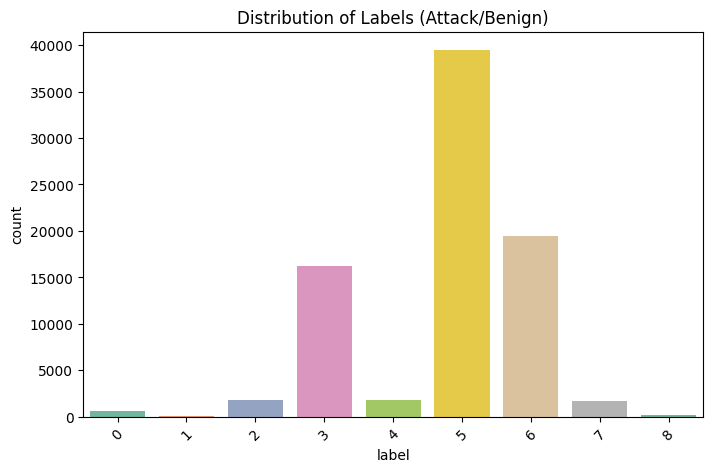

In [12]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='label', palette='Set2')
plt.title("Distribution of Labels (Attack/Benign)")
plt.xticks(rotation=45)
plt.show()

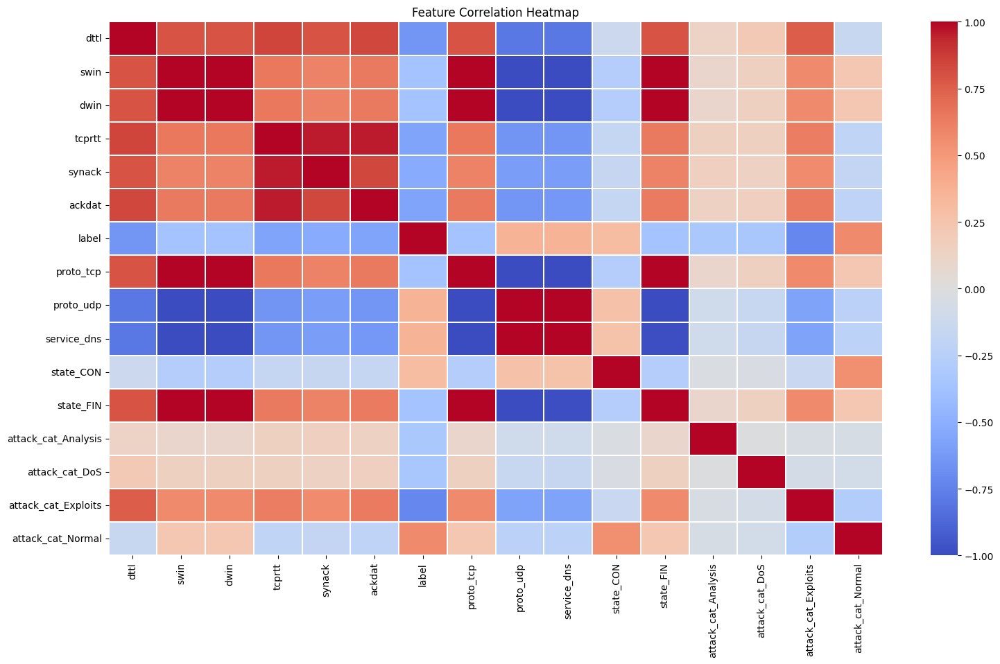

In [13]:
plt.figure(figsize=(18,10))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap='coolwarm', annot=False, linewidths=0.2)
plt.title("Feature Correlation Heatmap")
plt.show()


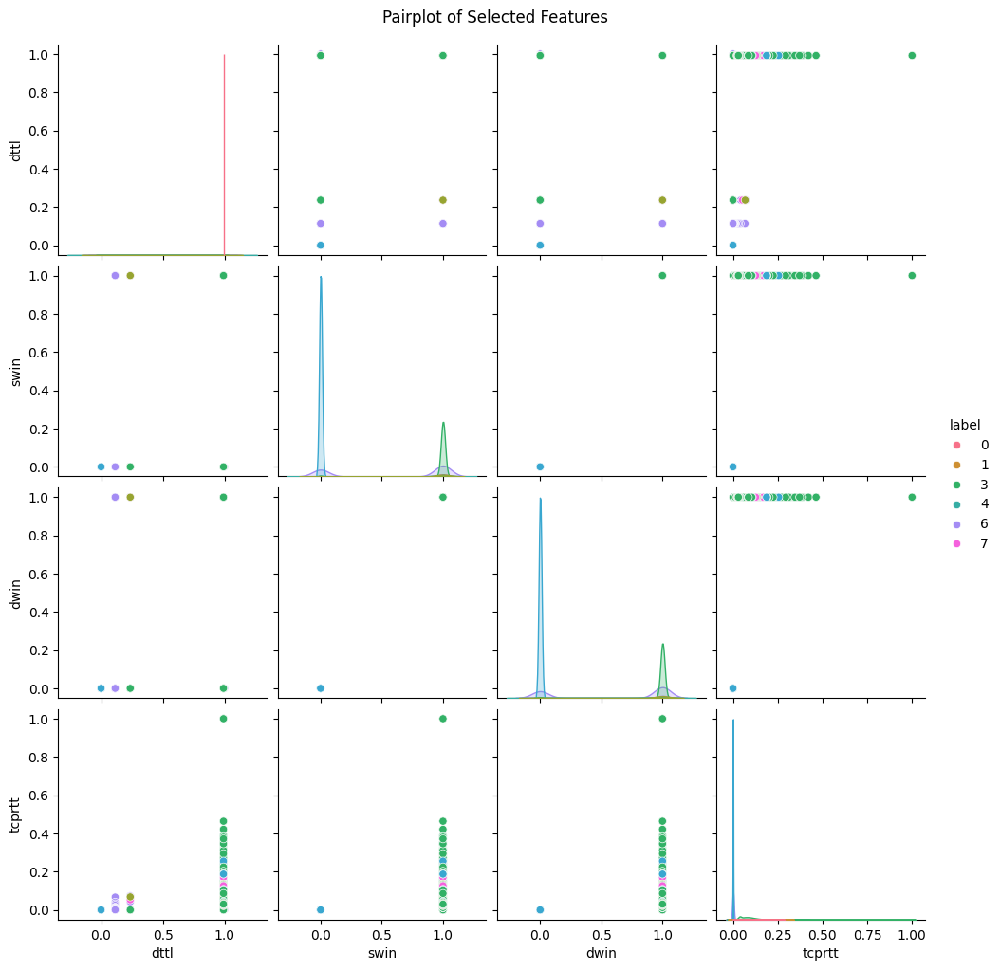

In [16]:
important_features = ['dttl', 'swin', 'dwin', 'tcprtt', 'label']
sns.pairplot(df[important_features], hue='label', palette='husl')
plt.suptitle("Pairplot of Selected Features", y=1.02)
plt.show()

In [17]:
fig = px.scatter_3d(
    df,
    x='swin',
    y='dwin',
    z='tcprtt', 
    color='label'
)
fig.update_layout(title='3D Scatter: Load & RTT vs. Label')
fig.show()

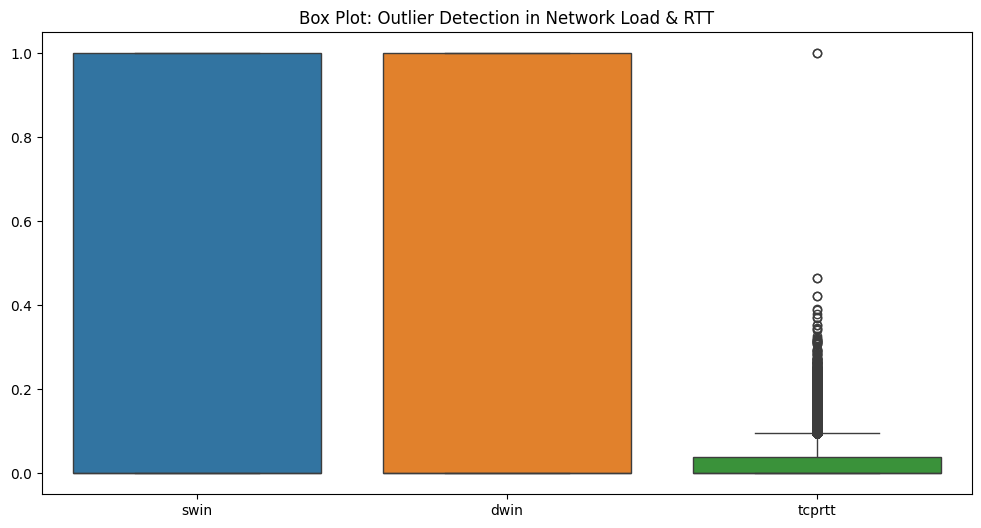

In [19]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[['swin', 'dwin', 'tcprtt']])
plt.title("Box Plot: Outlier Detection in Network Load & RTT")
plt.show()

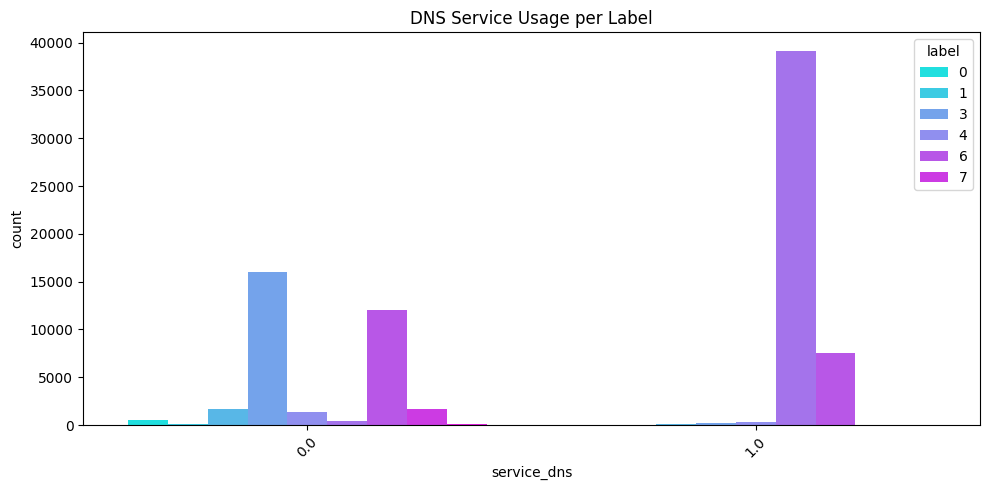

In [21]:
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='service_dns', hue='label', palette='cool')
plt.title("DNS Service Usage per Label")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/219831219.py:5: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/219831219.py:5: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/219831219.py:5: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



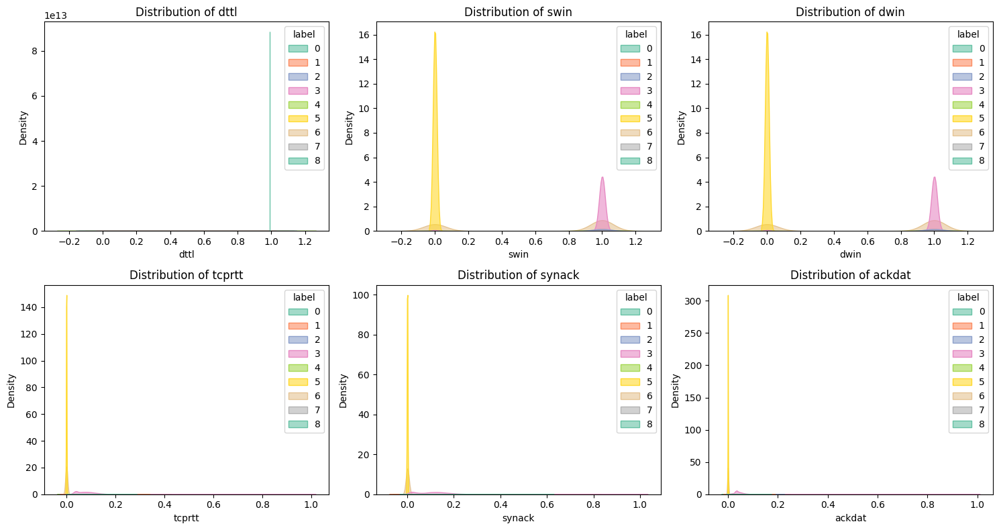

In [23]:
top_features = ['dttl', 'swin', 'dwin', 'tcprtt', 'synack', 'ackdat', 'label']
plt.figure(figsize=(15, 8))
for i, col in enumerate(top_features[:-1]):
    plt.subplot(2, 3, i+1)
    sns.kdeplot(data=df, x=col, hue='label', fill=True, palette='Set2', alpha=0.6)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()


In [24]:
label_counts = df['label'].value_counts()
fig = px.pie(values=label_counts.values, names=label_counts.index, hole=0.5,
             title="Label Distribution (Benign vs Attacks)", color_discrete_sequence=px.colors.qualitative.Set3)
fig.show()

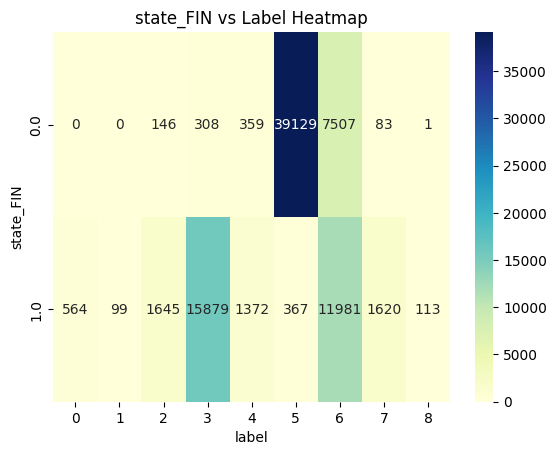

In [26]:
proto_label_ct = pd.crosstab(df['state_FIN'], df['label'])
sns.heatmap(proto_label_ct, annot=True, fmt='d', cmap='YlGnBu')
plt.title('state_FIN vs Label Heatmap')
plt.show()


/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/1975822353.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




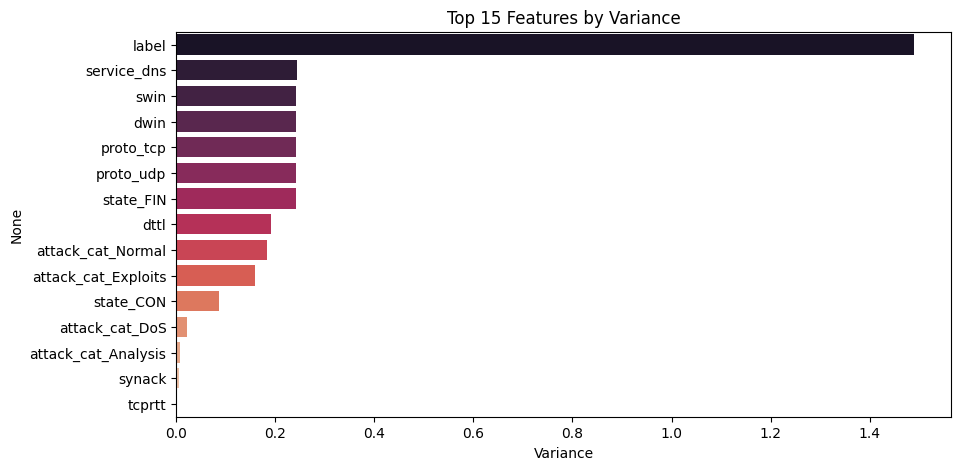

In [27]:
variances = df.var(numeric_only=True).sort_values(ascending=False)[:15]
plt.figure(figsize=(10,5))
sns.barplot(x=variances.values, y=variances.index, palette='rocket')
plt.title("Top 15 Features by Variance")
plt.xlabel("Variance")
plt.show()


In [29]:
fig = px.scatter_matrix(df,
                        dimensions=['dttl', 'swin', 'tcprtt', 'synack', 'ackdat'],
                        color='label',
                        title="Multivariate Feature Relationship",
                        height=800)
fig.update_traces(diagonal_visible=False)
fig.show()


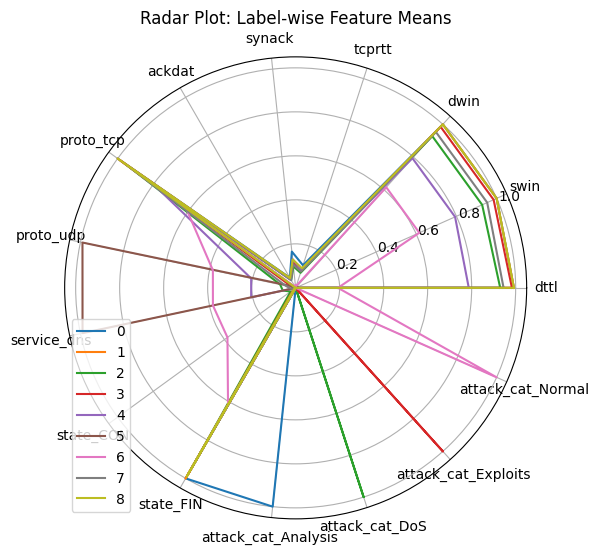

In [31]:
feature_means = df.groupby('label').mean(numeric_only=True)
categories = list(feature_means.columns)

fig = plt.figure(figsize=(6,6))
for label in feature_means.index:
    values = feature_means.loc[label, categories].values.flatten().tolist()
    values += values[:1]
    angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
    angles += angles[:1]
    plt.polar(angles, values, label=label)

plt.xticks([n / float(len(categories)) * 2 * pi for n in range(len(categories))], categories)
plt.title("Radar Plot: Label-wise Feature Means")
plt.legend()
plt.show()


In [32]:
X = df.drop(columns=["label"])
y = df["label"]

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED, stratify=y)
model = TabNetClassifier(seed=SEED)

/usr/local/lib/python3.9/site-packages/pytorch_tabnet/abstract_model.py:82: UserWarning:

Device used : cpu



In [34]:
model.fit(
    X_train.values, y_train.values,
    eval_set=[(X_test.values, y_test.values)],
    max_epochs=50,
    batch_size=1024,
    virtual_batch_size=128,
    patience=10
)

epoch 0  | loss: 0.53564 | val_0_accuracy: 0.45562 |  0:00:07s
epoch 1  | loss: 0.09347 | val_0_accuracy: 0.38405 |  0:00:14s
epoch 2  | loss: 0.08748 | val_0_accuracy: 0.45845 |  0:00:20s
epoch 3  | loss: 0.08279 | val_0_accuracy: 0.48063 |  0:00:27s
epoch 4  | loss: 0.08391 | val_0_accuracy: 0.94672 |  0:00:34s
epoch 5  | loss: 0.08773 | val_0_accuracy: 0.96723 |  0:00:43s
epoch 6  | loss: 0.08398 | val_0_accuracy: 0.97099 |  0:00:51s
epoch 7  | loss: 0.08207 | val_0_accuracy: 0.96859 |  0:00:56s
epoch 8  | loss: 0.08188 | val_0_accuracy: 0.96859 |  0:01:03s
epoch 9  | loss: 0.08108 | val_0_accuracy: 0.9713  |  0:01:09s
epoch 10 | loss: 0.08103 | val_0_accuracy: 0.9713  |  0:01:16s
epoch 11 | loss: 0.08066 | val_0_accuracy: 0.97123 |  0:01:22s
epoch 12 | loss: 0.08176 | val_0_accuracy: 0.96852 |  0:01:28s
epoch 13 | loss: 0.08125 | val_0_accuracy: 0.9713  |  0:01:35s
epoch 14 | loss: 0.08084 | val_0_accuracy: 0.97117 |  0:01:41s
epoch 15 | loss: 0.08191 | val_0_accuracy: 0.9713  |  0

/usr/local/lib/python3.9/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning:

Best weights from best epoch are automatically used!



In [35]:
y_train_pred = model.predict(X_train.values)
y_val_pred = model.predict(X_test.values)

In [36]:
train_loss = model.history.history.get("loss", [None])[-1]
train_acc = accuracy_score(y_train.values, y_train_pred)

In [37]:
val_loss_key = next((key for key in model.history.history.keys() if "val" in key.lower()), None)
val_loss = model.history.history[val_loss_key][-1] if val_loss_key else None

In [38]:
val_acc = accuracy_score(y_test.values, y_val_pred)
val_prec = precision_score(y_test.values, y_val_pred, average='macro')
val_rec = recall_score(y_test.values, y_val_pred, average='macro')

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [39]:
print({
    "Train Loss": train_loss,
    "Train Accuracy": train_acc,
    "Val Loss": val_loss,
    "Val Accuracy": val_acc,
    "Val Precision": val_prec,
    "Val Recall": val_rec,
})

{'Train Loss': 0.08077838407858971, 'Train Accuracy': 0.971064707875204, 'Val Loss': 0.971296581459809, 'Val Accuracy': 0.971296581459809, 'Val Precision': 0.6057918661870652, 'Val Recall': 0.6646482301751038}


In [40]:
print(f'\nFinal Accuracy: {val_acc}\n')
print(classification_report(y_test.values, y_val_pred))

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.




Final Accuracy: 0.971296581459809

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       113
           1       0.00      0.00      0.00        20
           2       1.00      1.00      1.00       358
           3       1.00      1.00      1.00      3237
           4       0.00      0.00      0.00       346
           5       0.99      0.99      0.99      7899
           6       1.00      1.00      1.00      3898
           7       0.46      0.99      0.63       341
           8       0.00      0.00      0.00        23

    accuracy                           0.97     16235
   macro avg       0.61      0.66      0.62     16235
weighted avg       0.96      0.97      0.96     16235



/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



# Model Prediction

In [45]:
sample_input = np.array([
    0.1, 20, 35, 1.5, 4.3, 10.2, 0, 1, 45, 0.67, 8, 3, 0.99, 0.5, 0.0
])
sample_input = sample_input.reshape(1, -1)

if sample_input.shape[1] != num_features:
    raise ValueError(f"Feature mismatch: Model expects {num_features} features, but received {sample_input.shape[1]}")


In [46]:
predicted_label = model.predict(sample_input)
predicted_probabilities = model.predict_proba(sample_input)

In [47]:
print(f"Predicted Label: {predicted_label[0]}")
print(f"Predicted Probabilities: {predicted_probabilities}")

Predicted Label: 2
Predicted Probabilities: [[1.3186797e-21 9.3477391e-14 9.9999988e-01 3.8410679e-08 6.7314702e-11
  2.8853897e-11 9.5596107e-08 5.8644744e-08 1.0732567e-15]]


In [48]:
y_pred = model.predict(X_test.values)
y_proba = model.predict_proba(X_test.values)

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



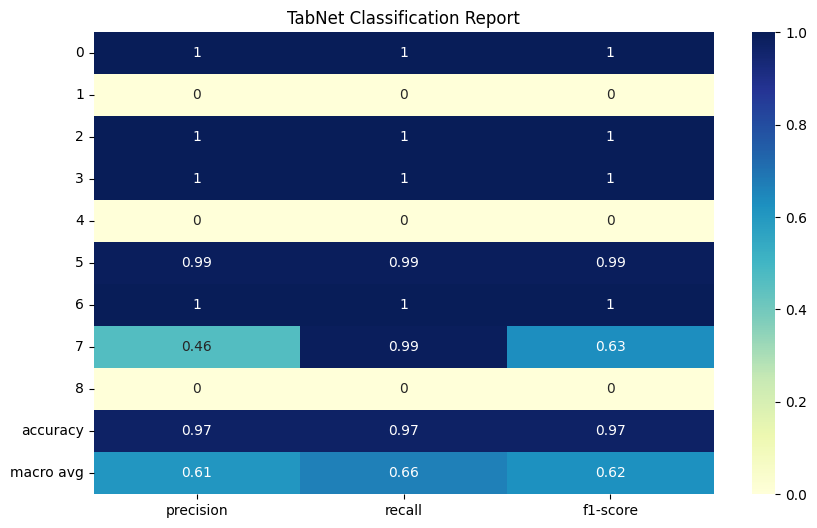

In [49]:
report = classification_report(y_test, y_pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()

plt.figure(figsize=(10,6))
sns.heatmap(df_report.iloc[:-1, :-1], annot=True, cmap='YlGnBu')
plt.title("TabNet Classification Report")
plt.show()

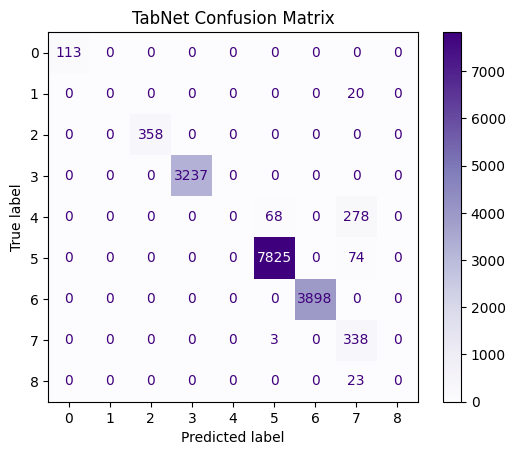

In [50]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Purples')
plt.title("TabNet Confusion Matrix")
plt.show()

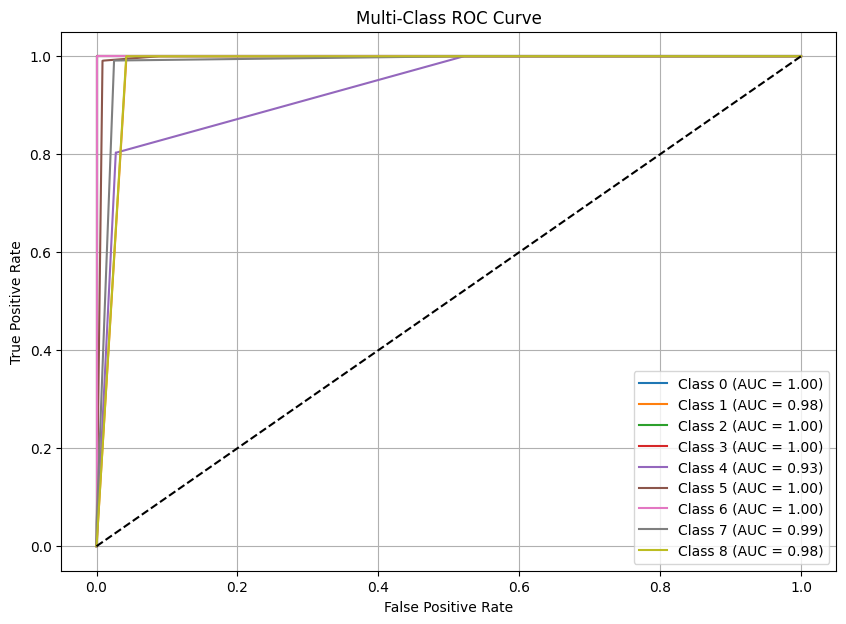

In [51]:
lb = LabelEncoder()
y_test_enc = lb.fit_transform(y_test)
y_score = y_proba
y_test_bin = label_binarize(y_test_enc, classes=np.unique(y_test_enc))

fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = y_test_bin.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10,7))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title('Multi-Class ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.show()


/var/folders/hz/1tq14hps0cvgb6gmb21yyrnw0000gn/T/ipykernel_84632/3620681531.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




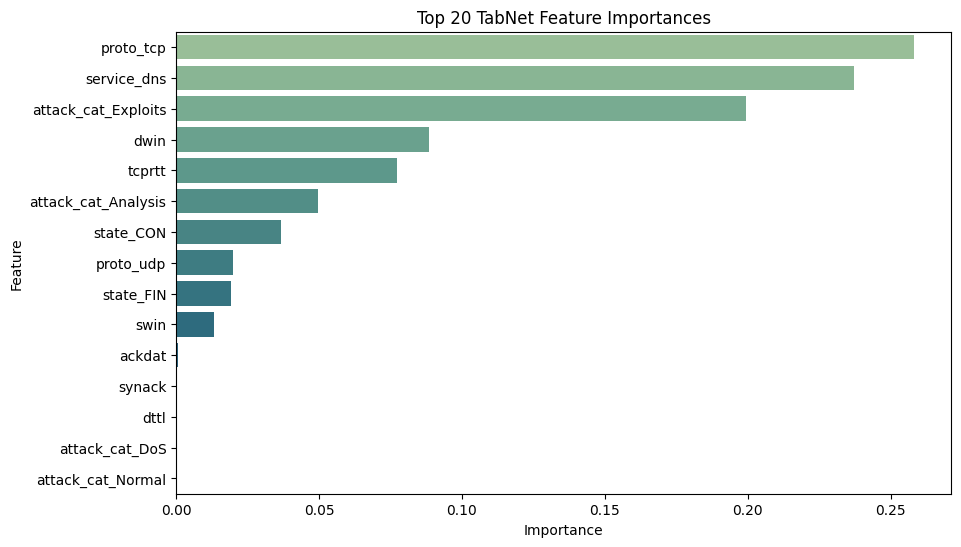

In [52]:
feature_importances = model.feature_importances_
columns = X_train.columns if hasattr(X_train, 'columns') else [f'feat_{i}' for i in range(X_train.shape[1])]

df_imp = pd.DataFrame({'Feature': columns, 'Importance': feature_importances})
df_imp = df_imp.sort_values('Importance', ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(data=df_imp.head(20), x='Importance', y='Feature', palette='crest')
plt.title("Top 20 TabNet Feature Importances")
plt.show()


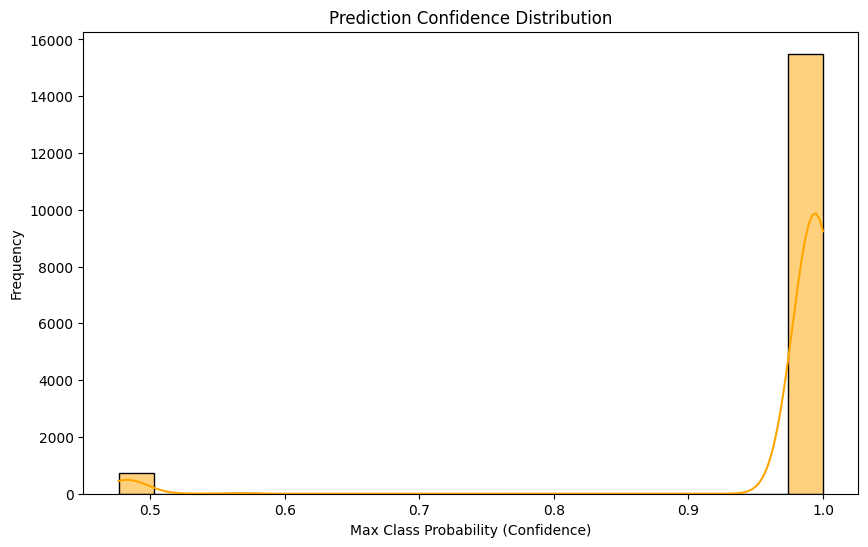

In [53]:
max_probas = np.max(y_proba, axis=1)
plt.figure(figsize=(10,6))
sns.histplot(max_probas, bins=20, kde=True, color='orange')
plt.title("Prediction Confidence Distribution")
plt.xlabel("Max Class Probability (Confidence)")
plt.ylabel("Frequency")
plt.show()


In [54]:
misclassified = X_test[y_pred != y_test]
mis_labels = y_test[y_pred != y_test]
print("Sample misclassifications:")
display(misclassified.head())

Sample misclassifications:


,dttl,swin,dwin,tcprtt,synack,ackdat,proto_tcp,proto_udp,service_dns,state_CON,state_FIN,attack_cat_Analysis,attack_cat_DoS,attack_cat_Exploits,attack_cat_Normal
18774,0.992126,1.0,1.0,0.143493,0.249561,0.060285,1.0,0.0,0.0,0.0,1.0,0,0,0,0
28391,0.992126,1.0,1.0,0.105981,0.188712,0.042943,1.0,0.0,0.0,0.0,1.0,0,0,0,0
20726,0.992126,1.0,1.0,0.165258,0.245441,0.084553,1.0,0.0,0.0,0.0,1.0,0,0,0,0
59326,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.0,1.0,0.0,0.0,0,0,0,0
34295,0.992126,1.0,1.0,0.099002,0.138781,0.053629,1.0,0.0,0.0,0.0,1.0,0,0,0,0


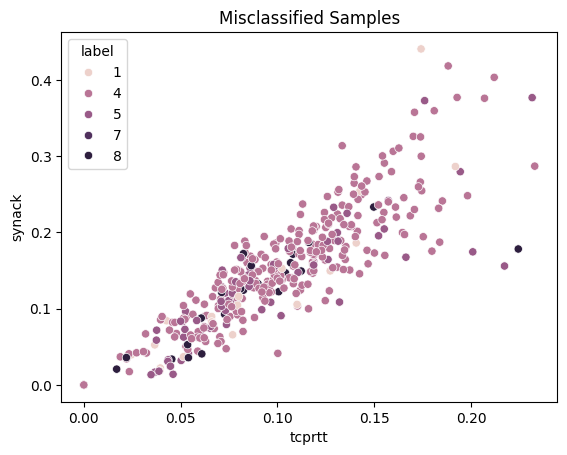

In [56]:
sns.scatterplot(x=misclassified['tcprtt'], y=misclassified['synack'], hue=mis_labels)
plt.title("Misclassified Samples")
plt.show()

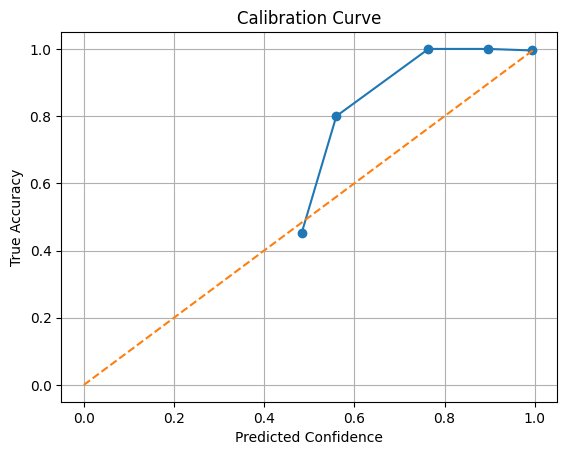

In [57]:
prob_true, prob_pred = calibration_curve(y_test == y_pred, max_probas, n_bins=10)
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1], [0,1], linestyle='--')
plt.xlabel("Predicted Confidence")
plt.ylabel("True Accuracy")
plt.title("Calibration Curve")
plt.grid()
plt.show()

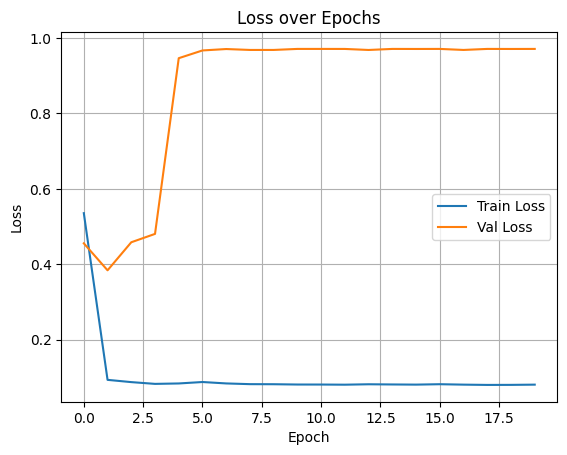

In [58]:
history = model.history.history
plt.plot(history['loss'], label='Train Loss')
if val_loss_key:
    plt.plot(history[val_loss_key], label='Val Loss')
plt.title("Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()

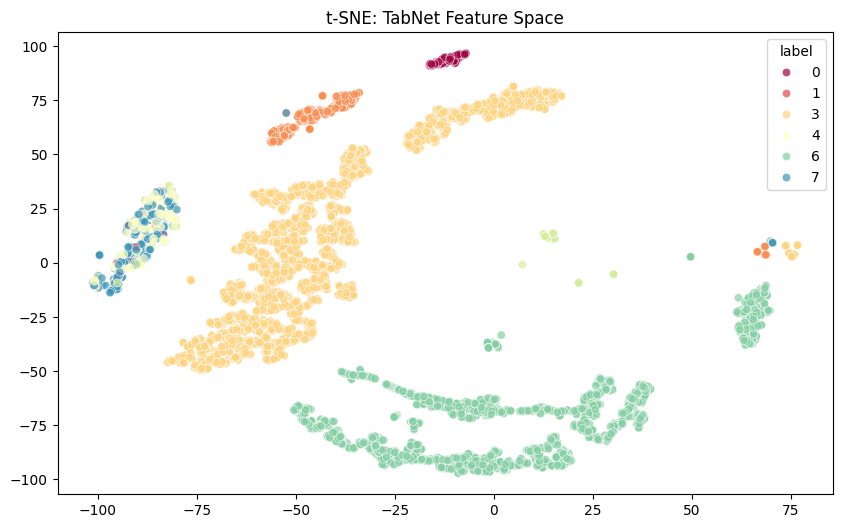

In [59]:
tsne = TSNE(n_components=2, random_state=SEED)
X_embedded = tsne.fit_transform(X_test)

plt.figure(figsize=(10,6))
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=y_test, palette='Spectral', alpha=0.7)
plt.title("t-SNE: TabNet Feature Space")
plt.show()

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/Sid/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



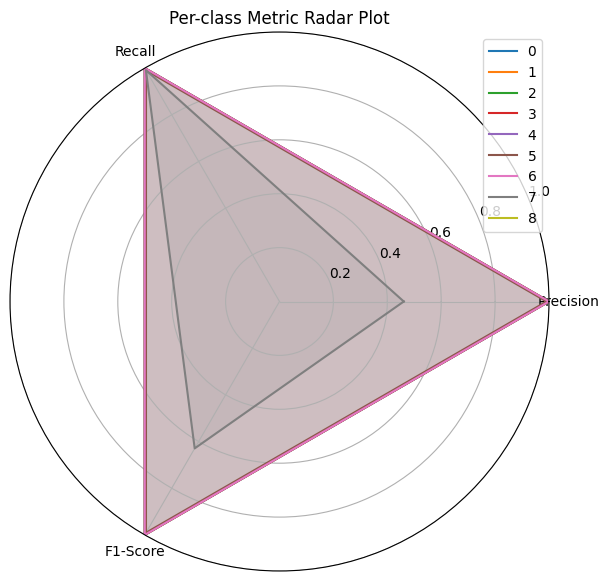

In [60]:
metrics = classification_report(y_test, y_pred, output_dict=True)
class_metrics = {
    label: [metrics[label]['precision'], metrics[label]['recall'], metrics[label]['f1-score']]
    for label in metrics if label not in ['accuracy', 'macro avg', 'weighted avg']
}

labels = list(class_metrics.keys())
values = np.array(list(class_metrics.values()))

angles = np.linspace(0, 2 * np.pi, len(values[0]), endpoint=False).tolist()
angles += angles[:1]

fig = plt.figure(figsize=(7,7))
ax = plt.subplot(111, polar=True)

for idx, val in enumerate(values):
    stats = val.tolist()
    stats += stats[:1]  
    ax.plot(angles, stats, label=labels[idx])
    ax.fill(angles, stats, alpha=0.1)

ax.set_thetagrids(np.degrees(angles[:-1]), ["Precision", "Recall", "F1-Score"])
ax.set_ylim(0, 1)

plt.title("Per-class Metric Radar Plot")
plt.legend()
plt.show()


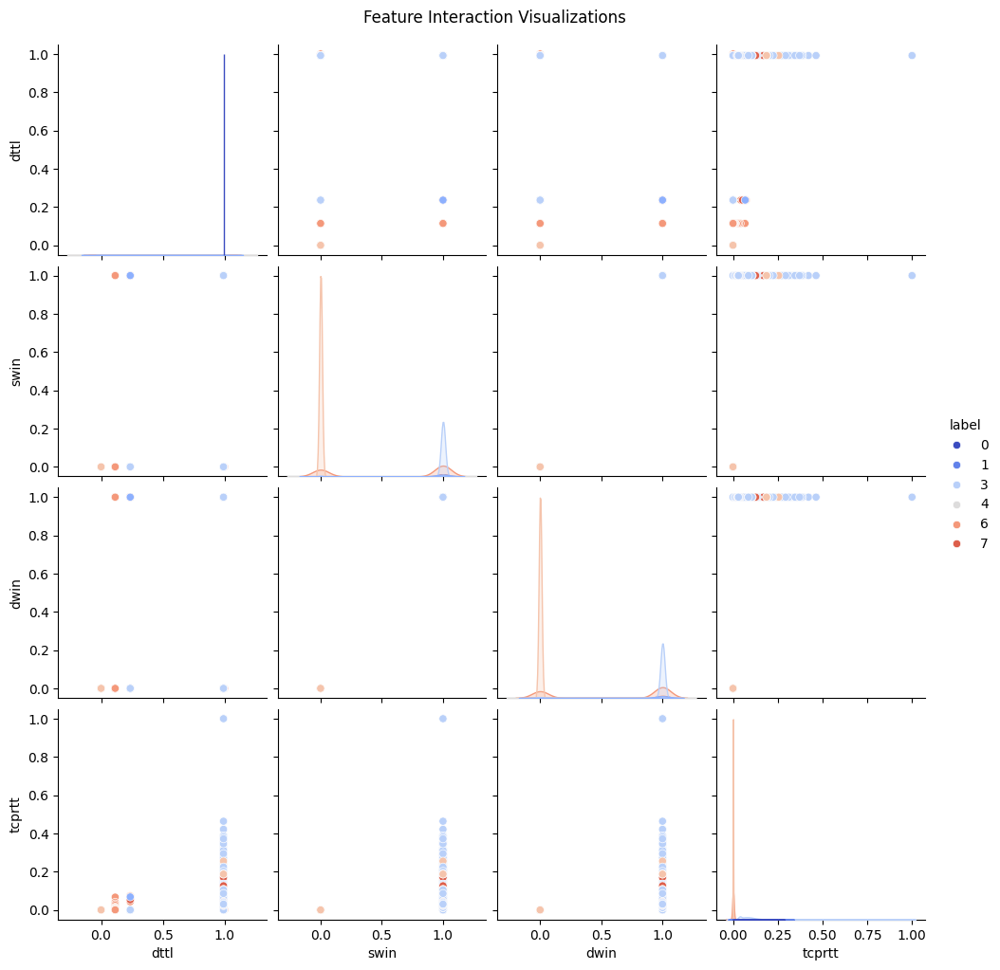

In [61]:
sns.pairplot(df[important_features], hue='label', palette='coolwarm', height=2.5)
plt.suptitle("Feature Interaction Visualizations", y=1.02)
plt.show()

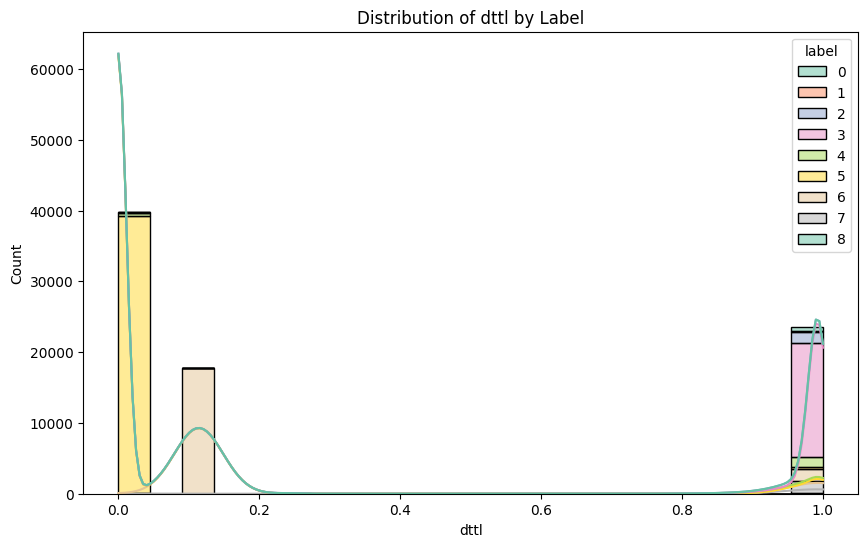

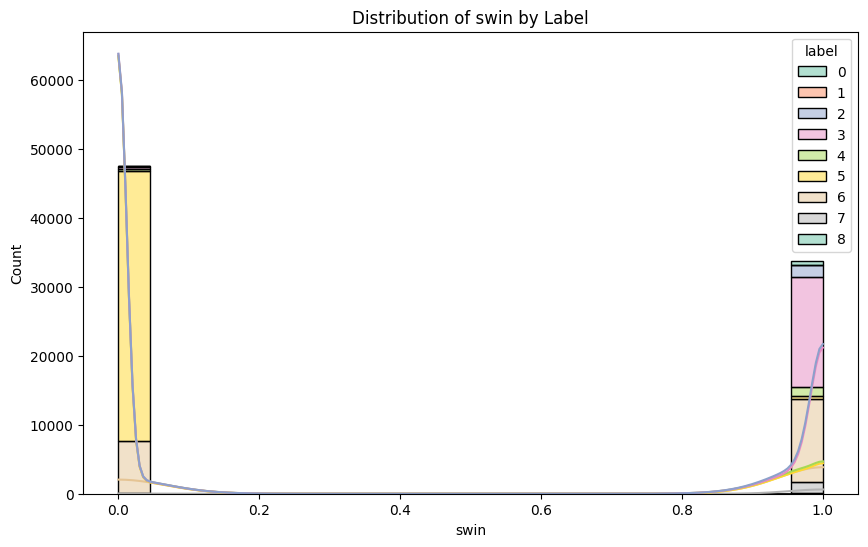

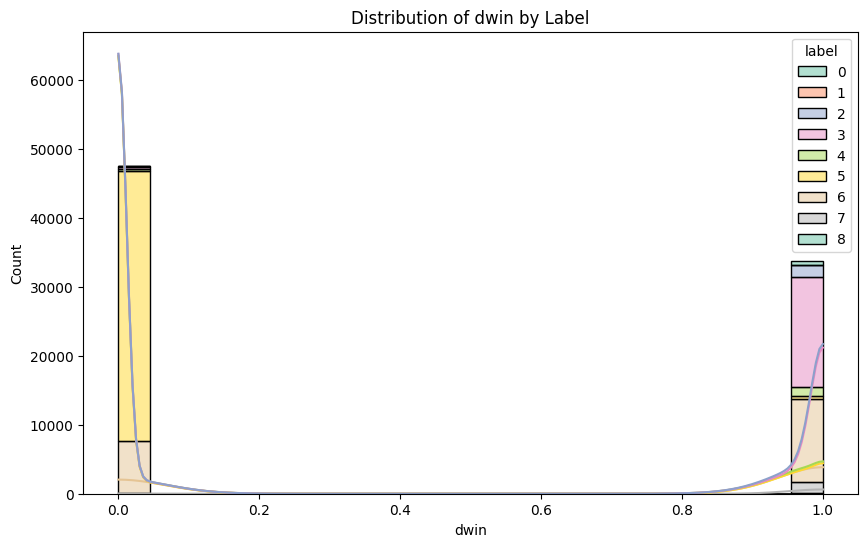

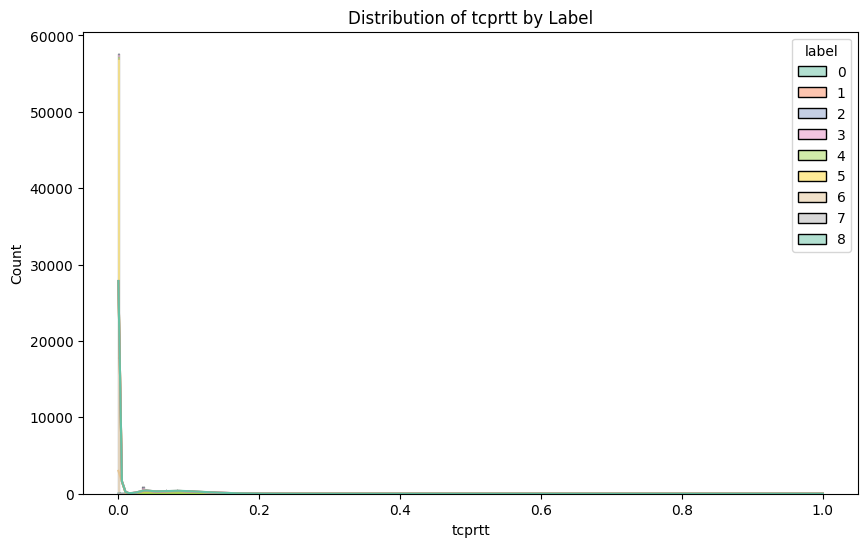

In [62]:
for feature in important_features[:-1]:
    plt.figure(figsize=(10, 6))
    sns.histplot(df, x=feature, hue='label', kde=True, multiple='stack', palette='Set2')
    plt.title(f"Distribution of {feature} by Label")
    plt.show()


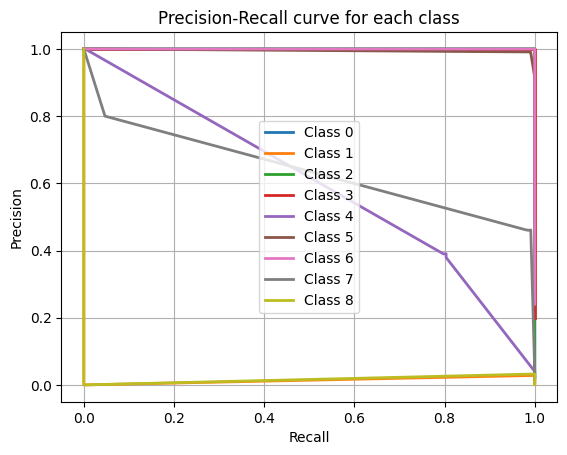

In [64]:
n_classes = len(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes=range(n_classes))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_proba[:, i])
    plt.plot(recall, precision, lw=2, label=f'Class {i}')

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall curve for each class")
plt.legend()
plt.grid(True)
plt.show()

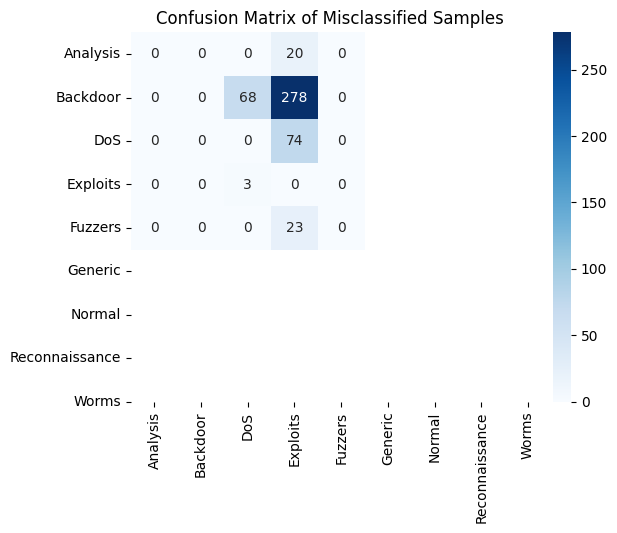

In [65]:
misclassified_df = X_test[y_pred != y_test]
misclassified_labels = y_test[y_pred != y_test]

cm_misclassified = confusion_matrix(misclassified_labels, y_pred[y_pred != y_test])
sns.heatmap(cm_misclassified, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix of Misclassified Samples")
plt.show()

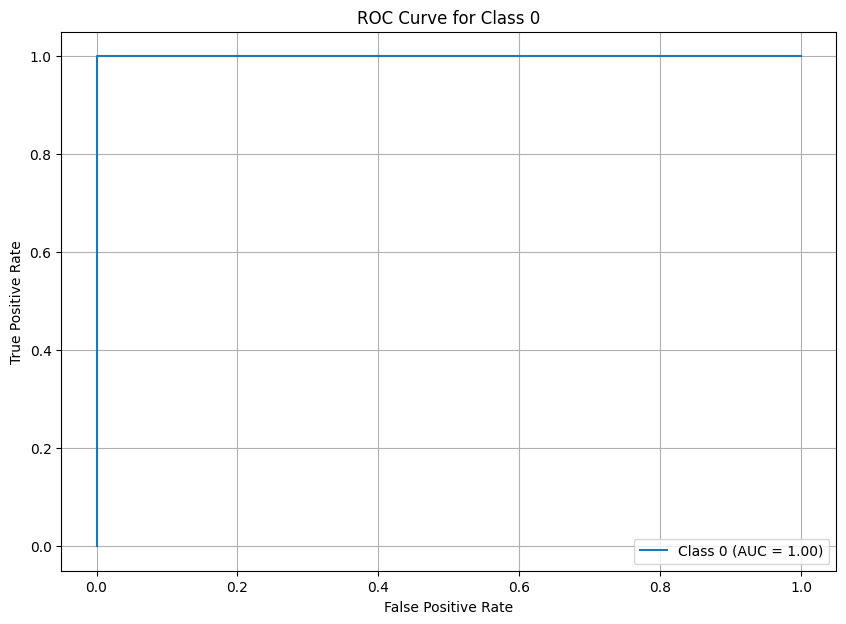

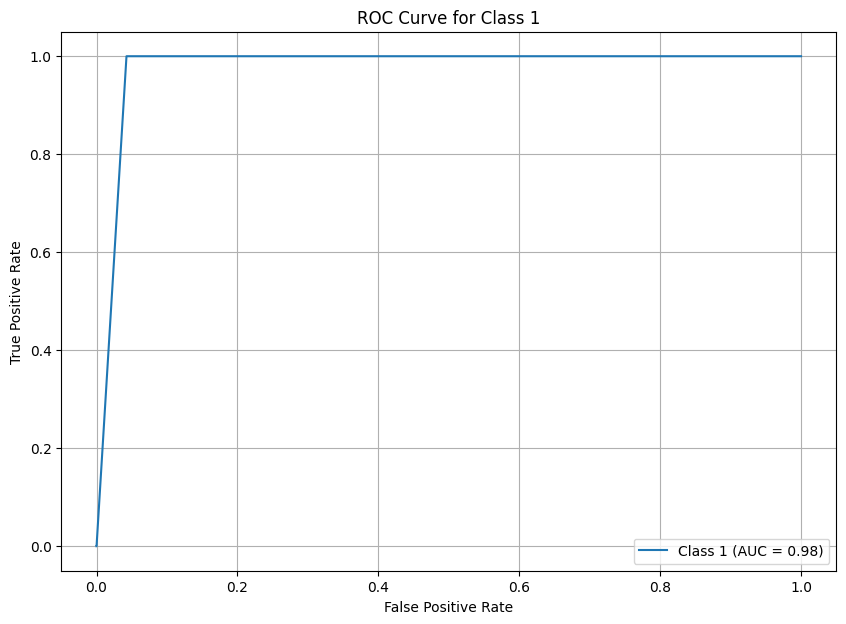

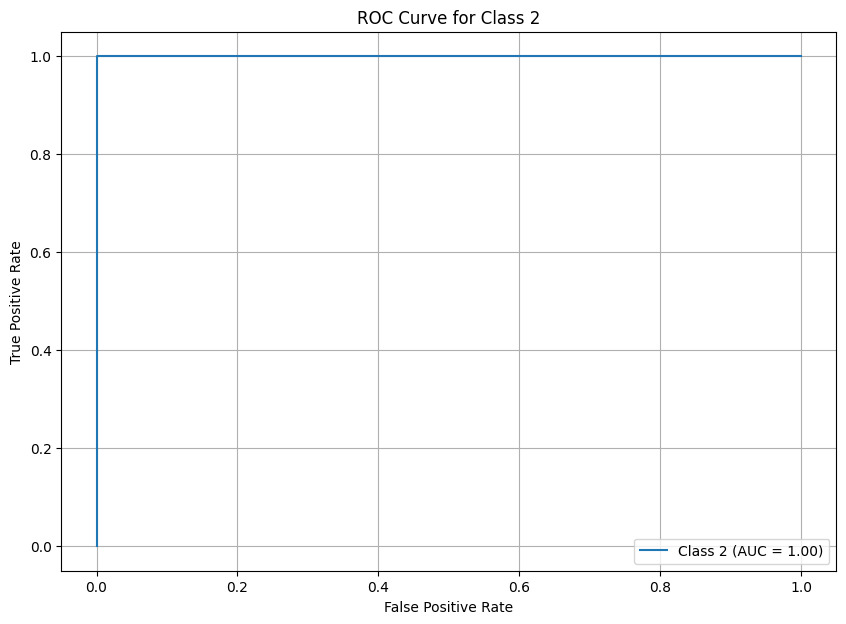

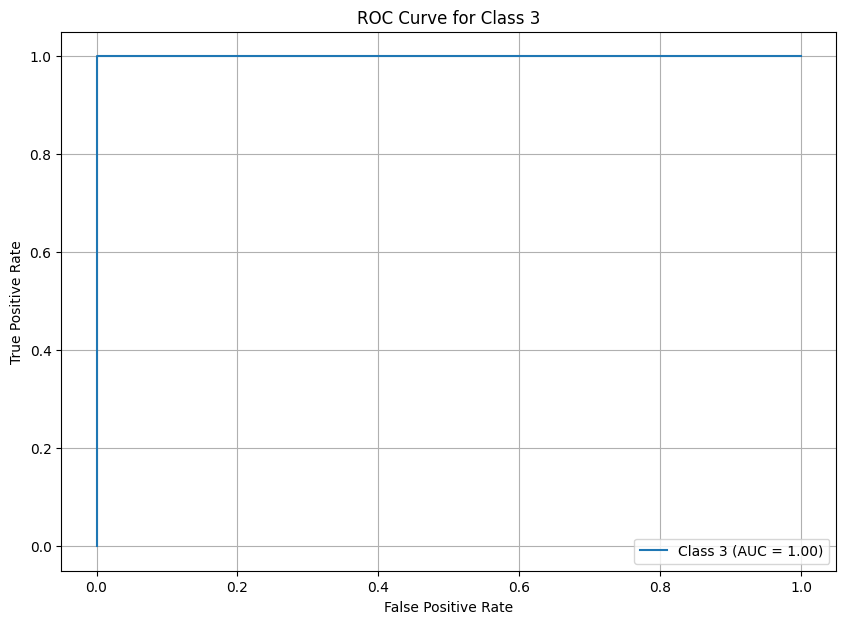

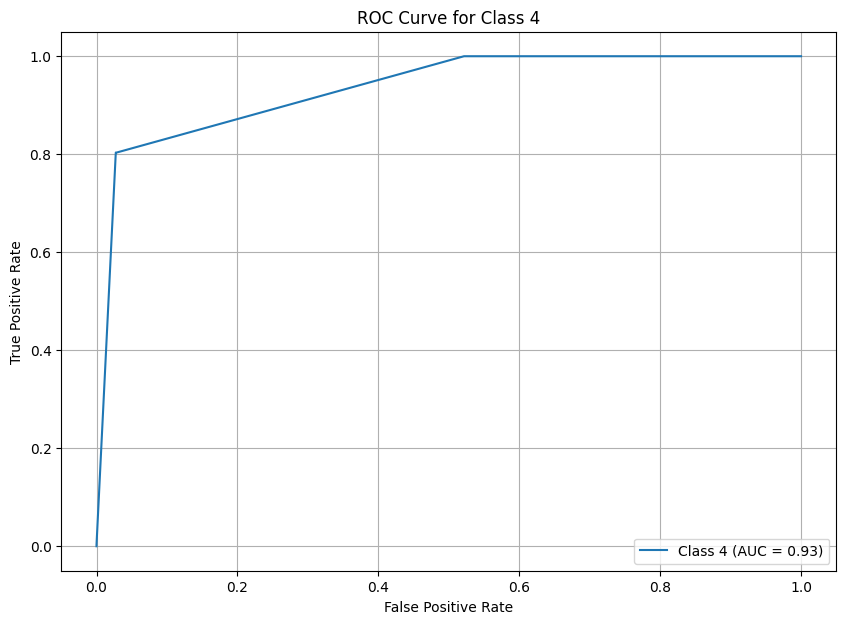

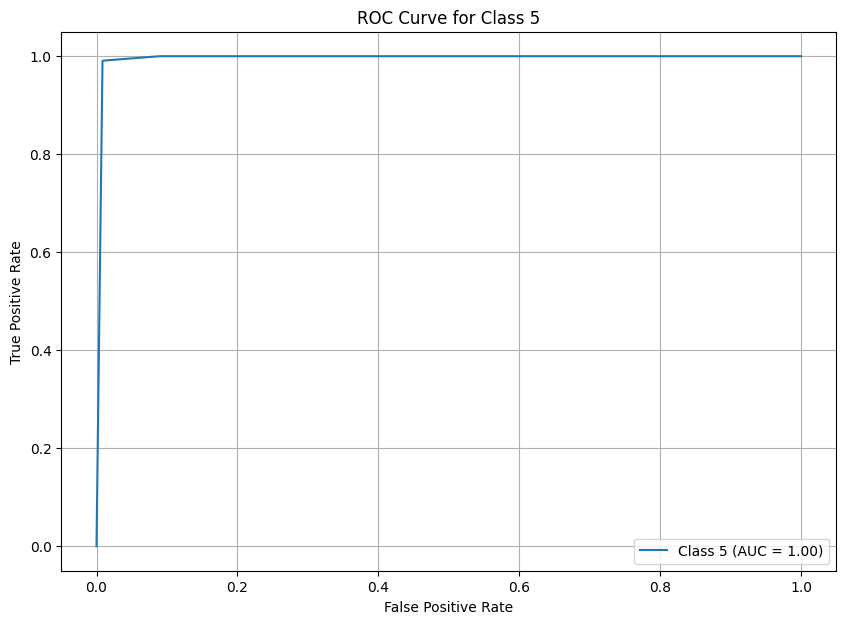

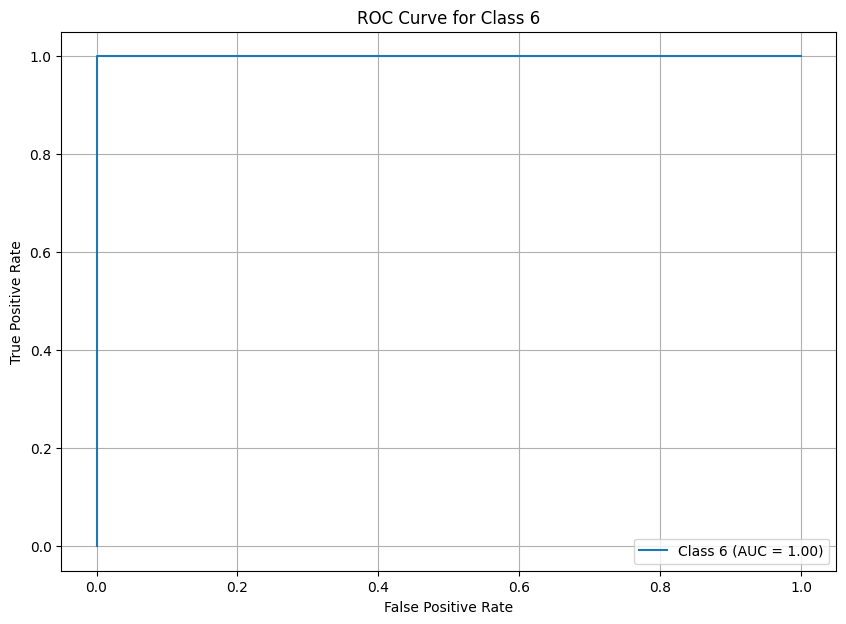

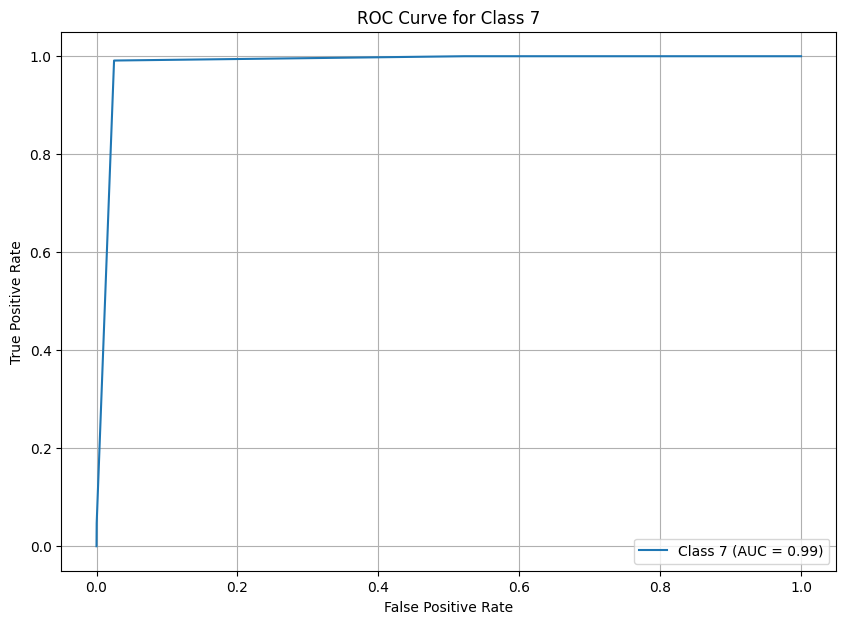

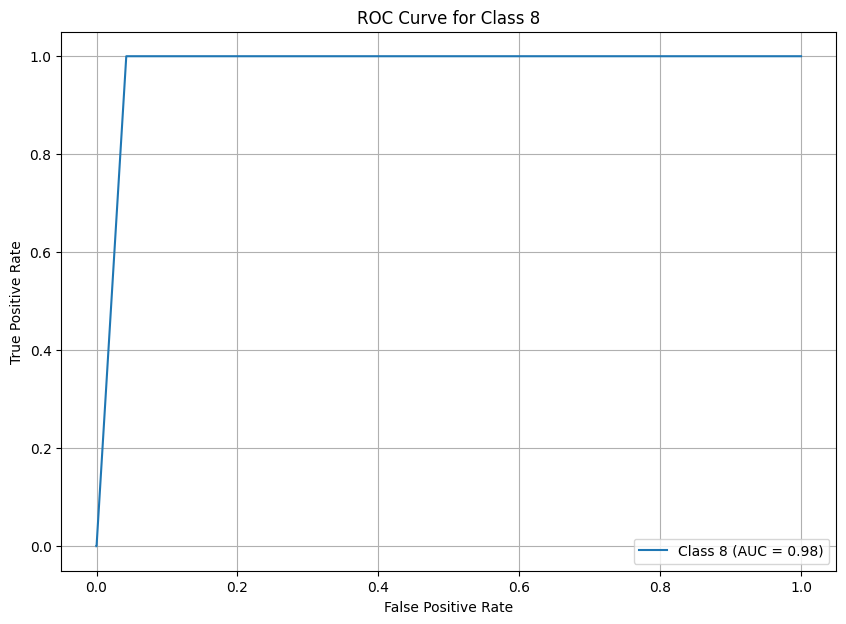

In [66]:
for i in range(n_classes):
    plt.figure(figsize=(10, 7))
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    plt.title(f'ROC Curve for Class {i}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()


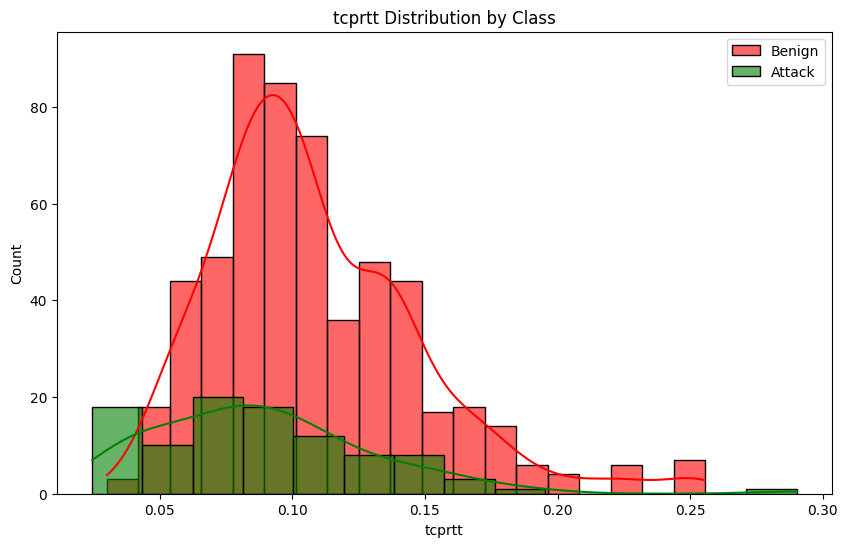

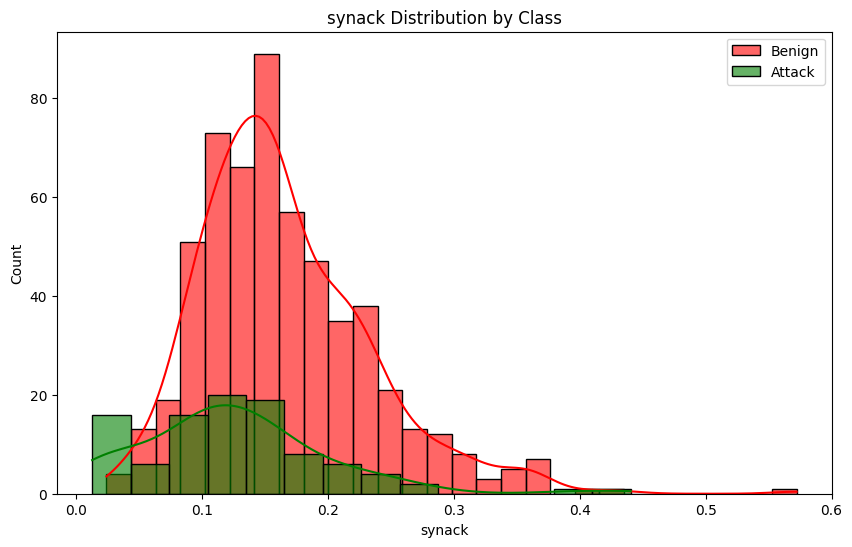

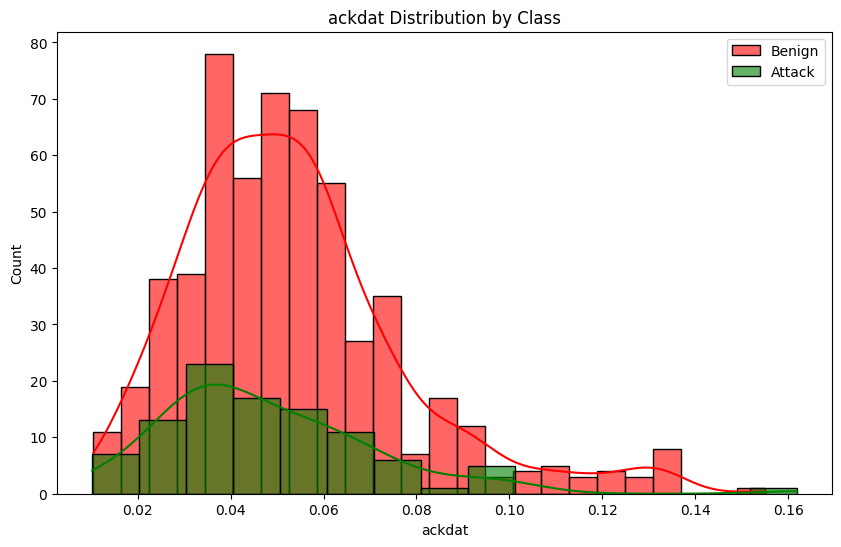

In [72]:
for feature in ['tcprtt', 'synack', 'ackdat']:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[df['label'] == 0][feature], kde=True, color='red', label='Benign', alpha=0.6)
    sns.histplot(df[df['label'] == 1][feature], kde=True, color='green', label='Attack', alpha=0.6)
    plt.title(f'{feature} Distribution by Class')
    plt.legend()
    plt.show()


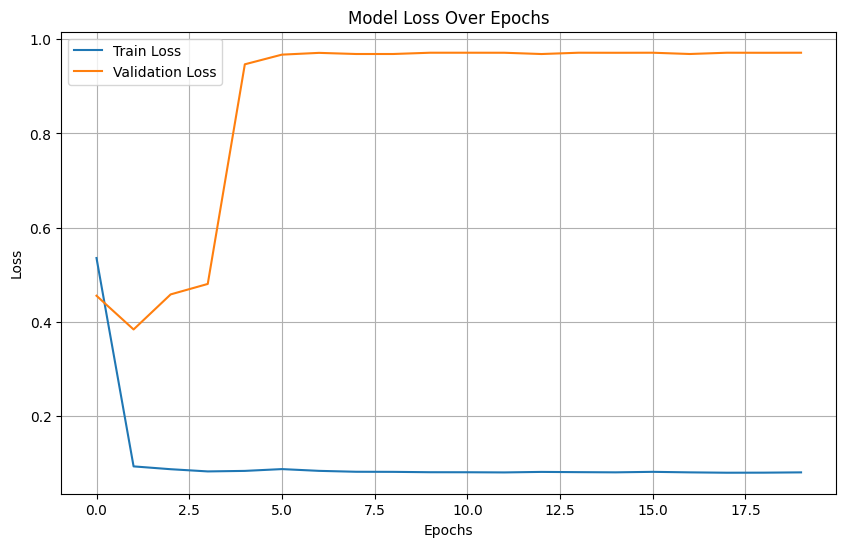

In [73]:
plt.figure(figsize=(10, 6))
plt.plot(model.history.history['loss'], label='Train Loss')
val_loss_key = next((k for k in model.history.history if 'val' in k.lower()), None)
if val_loss_key:
    plt.plot(model.history.history[val_loss_key], label='Validation Loss')

plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()